In [35]:
%matplotlib inline
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf
from ydata_profiling import ProfileReport
from datetime import datetime
from sklearn import preprocessing as pre

Przydatne linki

https://towardsdatascience.com/how-to-do-an-eda-for-time-series-cbb92b3b1913

https://medium.com/analytics-vidhya/how-to-guide-on-exploratory-data-analysis-for-time-series-data-34250ff1d04f

http://fizyka.umk.pl/publications/kmk/Prace-Mgr/07-07a-Przemyslaw_Wlodarczyk.pdf

!: https://towardsdatascience.com/everything-you-need-to-know-about-time-series-5fa1834d5b18

In [36]:
df = pd.read_csv('tbl_pods_raw.csv')

C:\Users\BC127735\AppData\Local\Temp\ipykernel_15468\234917894.py:1: DtypeWarning: Columns (11,25,26,29) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('tbl_pods_raw.csv')


In [37]:
pd.set_option('display.max_columns', None) # Want to see all columns
print(df.shape) # Rows x columns
print(df.columns) # Show all columns
df.head() # Show first 5 rows

(115365, 55)
Index(['IsTempRecord', 'Reporter', 'Country', 'State', 'Week', 'Year', 'Month',
       'SiteLetter', 'SiteNumber', 'TreeNumber', 'PCSample', 'Variety',
       'Moisture', 'Texture', 'Canopy', 'Maintenance', 'Flowers',
       'Leaf flushing', 'WB', 'Monilia T/S', 'Monilia M/L', 'Monilia M',
       'Black Pod', 'Other D/D', 'Harvest', 'Drying', 'Fermentation',
       'Fertilizer', 'Fungicide', 'Irrigation', 'Tiny', 'Small', 'Medium',
       'Large', 'Mature', 'Ripe', 'Wilt', 'Damaged', 'Healthy', 'Total',
       'Cherelles', 'Adults', 'ImportDate', 'ID', 'ts', 'Main', 'Region',
       'CountDay', 'SmallBefore', 'TinyBefore', 'MediumBefore', 'LargeBefore',
       'SmallBefore2', 'LargeBefore2', 'Mid'],
      dtype='object')


,IsTempRecord,Reporter,Country,State,Week,Year,Month,SiteLetter,SiteNumber,TreeNumber,PCSample,Variety,Moisture,Texture,Canopy,Maintenance,Flowers,Leaf flushing,WB,Monilia T/S,Monilia M/L,Monilia M,Black Pod,Other D/D,Harvest,Drying,Fermentation,Fertilizer,Fungicide,Irrigation,Tiny,Small,Medium,Large,Mature,Ripe,Wilt,Damaged,Healthy,Total,Cherelles,Adults,ImportDate,ID,ts,Main,Region,CountDay,SmallBefore,TinyBefore,MediumBefore,LargeBefore,SmallBefore2,LargeBefore2,Mid
0,False,CIV,Cote d Ivoire,NaN,44,1997,10,AG,2,0,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,4.0,NaN,2.0,96.0,4.0,3.0,0.0,108.0,111.0,6.0,102.0,2019-06-11 13:44:14.510,1729,b'\x00\x00\x00\x03\x89N\x1e\xf2',108.0,Lagunes,Abengourou,NaN,NaN,NaN,NaN,NaN,NaN,0.0
1,False,CIV,Cote d Ivoire,NaN,44,1997,10,AG,10,0,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,3.0,NaN,9.0,171.0,8.0,3.0,2.0,192.0,197.0,4.0,188.0,2019-06-11 13:44:14.510,1732,b'\x00\x00\x00\x03\x89N\x1e\xf5',192.0,Comoé,Abengourou,NaN,NaN,NaN,NaN,NaN,NaN,0.0
2,False,CIV,Cote d Ivoire,NaN,44,1997,10,AG,11,0,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,2.0,NaN,2.0,71.0,24.0,2.0,4.0,100.0,106.0,3.0,97.0,2019-06-11 13:44:14.510,1733,b'\x00\x00\x00\x03\x89N\x1e\xf6',100.0,Comoé,Abengourou,NaN,NaN,NaN,NaN,NaN,NaN,0.0
3,False,CIV,Cote d Ivoire,NaN,44,1997,10,AG,12,0,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.0,27.0,NaN,8.0,142.0,14.0,25.0,7.0,199.0,231.0,35.0,164.0,2019-06-11 13:44:14.510,1734,b'\x00\x00\x00\x03\x89N\x1e\xf7',199.0,Comoé,Abengourou,NaN,NaN,NaN,NaN,NaN,NaN,0.0
4,False,CIV,Cote d Ivoire,NaN,44,1997,10,AG,13,0,Y,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.0,7.0,NaN,16.0,97.0,40.0,15.0,13.0,164.0,192.0,11.0,153.0,2019-06-11 13:44:14.510,1735,b'\x00\x00\x00\x03\x89N\x1e\xf8',164.0,Lacs,Abengourou,NaN,NaN,NaN,NaN,NaN,NaN,0.0


In [4]:
df.tail()

,IsTempRecord,Reporter,Country,State,Week,Year,Month,SiteLetter,SiteNumber,TreeNumber,PCSample,Variety,Moisture,Texture,Canopy,Maintenance,Flowers,Leaf flushing,WB,Monilia T/S,Monilia M/L,Monilia M,Black Pod,Other D/D,Harvest,Drying,Fermentation,Fertilizer,Fungicide,Irrigation,Tiny,Small,Medium,Large,Mature,Ripe,Wilt,Damaged,Healthy,Total,Cherelles,Adults,ImportDate,ID,ts,Main,Region,CountDay,SmallBefore,TinyBefore,MediumBefore,LargeBefore,SmallBefore2,LargeBefore2,Mid
115360,False,GHA,Ghana,NaN,29,2023,7,WS,147,0,Y,NaN,0.0,4.0,3.0,3.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.0,2.0,NaN,1.0,23.0,0.0,0.0,0.0,44.0,44.0,20.0,24.0,2023-07-24 08:51:14.133,188884,"b'\x00\x00\x00,p\xfeo\x80'",32.5,Western N.,NaN,17.0,21.0,NaN,6.0,27.0,3.0,11.5
115361,False,GHA,Ghana,NaN,29,2023,7,WS,151,0,Y,NaN,0.0,4.0,4.0,4.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.0,9.0,NaN,6.0,11.0,2.0,0.0,1.0,66.0,67.0,47.0,19.0,2023-07-24 08:51:14.133,188887,"b'\x00\x00\x00,p\xfeo\x81'",58.5,Western S.,NaN,6.0,11.0,NaN,0.0,6.0,0.0,7.5
115362,False,GHA,Ghana,NaN,29,2023,7,WS,156,0,Y,NaN,0.0,4.0,4.0,4.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,94.0,31.0,NaN,18.0,14.0,0.0,0.0,3.0,157.0,160.0,125.0,32.0,2023-07-24 08:51:14.133,188893,"b'\x00\x00\x00,p\xfeo\x83'",150.0,Western S.,NaN,26.0,45.0,NaN,4.0,11.0,4.0,7.0
115363,False,GHA,Ghana,NaN,29,2023,7,WS,171,0,Y,NaN,0.0,4.0,4.0,4.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,74.0,12.0,NaN,3.0,13.0,4.0,3.0,4.0,106.0,113.0,86.0,20.0,2023-07-24 08:51:14.133,188890,"b'\x00\x00\x00,p\xfeo\x84'",95.5,Western N.,NaN,12.0,27.0,NaN,3.0,6.0,3.0,10.5
115364,False,GHA,Ghana,NaN,29,2023,7,WS,152,0,Y,NaN,0.0,5.0,4.0,3.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,41.0,20.0,NaN,2.0,3.0,0.0,2.0,0.0,66.0,68.0,61.0,5.0,2023-07-24 08:51:14.133,188895,"b'\x00\x00\x00,p\xfeo\x82'",64.5,Western S.,NaN,7.0,20.0,NaN,0.0,1.0,0.0,1.5


In [38]:
print(df.nunique(axis=0)) # Check number of unique values for each column
df.describe().apply(lambda s: s.apply(lambda x: format(x, 'f'))).T # Check basic statistics for each column

IsTempRecord          1
Reporter              6
Country               6
State                 4
Week                146
Year                 27
Month                12
SiteLetter           76
SiteNumber          199
TreeNumber            6
PCSample              1
Variety               2
Moisture           1071
Texture              11
Canopy               11
Maintenance           7
Flowers              11
Leaf flushing         9
WB                    7
Monilia T/S          17
Monilia M/L          22
Monilia M            21
Black Pod            34
Other D/D            77
Harvest               2
Drying                2
Fermentation          2
Fertilizer            2
Fungicide             2
Irrigation            2
Tiny                354
Small               309
Medium              131
Large               163
Mature              264
Ripe                127
Wilt                 87
Damaged              80
Healthy             606
Total               627
Cherelles           498
Adults          

,count,mean,std,min,25%,50%,75%,max
Week,115365.000000,83.000087,326.002556,0.000000,0.000000,0.000000,21.000000,1946.000000
Year,115365.000000,2016.649070,4.895014,1997.000000,2014.000000,2018.000000,2020.000000,2023.000000
Month,115365.000000,6.224999,3.424394,1.000000,3.000000,6.000000,9.000000,12.000000
SiteNumber,115365.000000,34.375122,73.008997,0.000000,6.000000,15.000000,25.000000,523.000000
TreeNumber,115365.000000,1.598058,1.818166,0.000000,0.000000,1.000000,3.000000,5.000000
Moisture,90486.000000,23.438032,15.091476,0.000000,14.200000,21.000000,30.000000,310.000000
Texture,112809.000000,2.858354,1.244809,0.000000,2.000000,3.000000,3.000000,313.000000
Canopy,112872.000000,2.969124,0.605042,0.000000,3.000000,3.000000,3.000000,45.000000
Maintenance,112873.000000,2.824023,0.921543,0.000000,2.000000,3.000000,3.000000,31.000000
Flowers,112842.000000,1.952730,0.967053,0.000000,1.000000,2.000000,2.000000,22.000000


Część danych może być odrzucona już na początku, ponieważ nie wnosi żadnej informacji potrzebnej w dalszej analizie.

Są to kolumny IsTempRecord, TreeNumber, PCSample, ImportDate, ID, ts, CountDay, SmallBefore, TinyBefore, MediumBefore, LargeBefore, SmallBefore2, LargeBefore2, Mid

W dodatku zmiennymi liczbowymi (docelowymi) na których będziemy się skupiać są Tiny, Small, Large oraz Mature. Resztę zmiennych dotyczących zbiorów można odrzucić. Odrzucone zostaną więc Medium, Ripe, Wilt, Damaged, Healthy, Total, Cherelles, Adults, Main.

In [39]:
df.drop(columns=["IsTempRecord", "TreeNumber", "PCSample", "ImportDate", "ID", "ts", 
                 "CountDay", "SmallBefore", "TinyBefore", "MediumBefore", "LargeBefore", 
                 "SmallBefore2", "LargeBefore2", "Mid", "Medium", "Ripe", "Wilt", "Damaged", 
                 "Healthy", "Total", "Cherelles", "Adults", "Main"], inplace=True)

Kolumny Year oraz Month można skonsolidować do postaci pojedynczej kolumny Date. Kolumna Week może zostać usunięta, ponieważ szeregi czasowe nie będą rozpatrywane na poziomie tygodnia, a miesiąca.

In [40]:
df['Date'] = [datetime(row["Year"], row["Month"], 1) for index, row in df.iterrows()]
df.drop(columns=["Week", "Year", "Month"], inplace=True)

Text(0, 0.5, 'Liczebność')

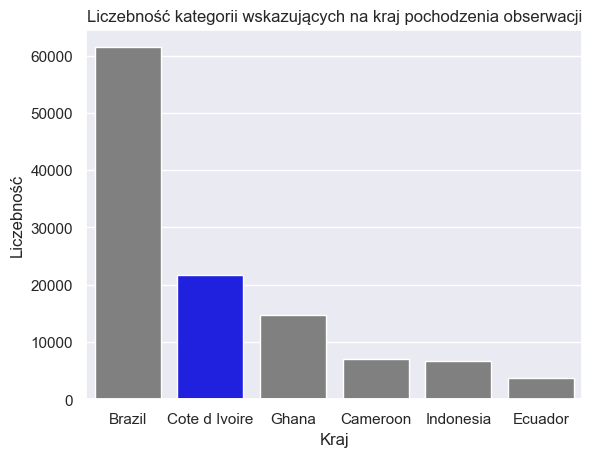

In [41]:
# Calculate the order of categories based on counts (highest to lowest)
order = df.groupby('Country').count().sum().sort_values(ascending=False).index

# Create a countplot with the sorted order
sns.set()
ax = sns.countplot(x='Country', data=df, palette=['blue'] + ['gray']*5, hue='Country', order=df['Country'].value_counts().index, dodge=False)
plt.title("Liczebność kategorii wskazujących na kraj pochodzenia obserwacji")
plt.legend([], [], frameon=False)
plt.xlabel("Kraj")
plt.ylabel("Liczebność")

Ponieważ nie posiadamy danych geograficznych dla państw innych niż Wybrzeże kości słoniowej, niestety trzeba pozbyć się części rekordów i zrobić analizę jedynie dla tego kraju.

In [42]:
df = df[df["Country"] == "Cote d Ivoire"]

Text(0.5, 1.0, 'Procentowe określenie brakujących danych')

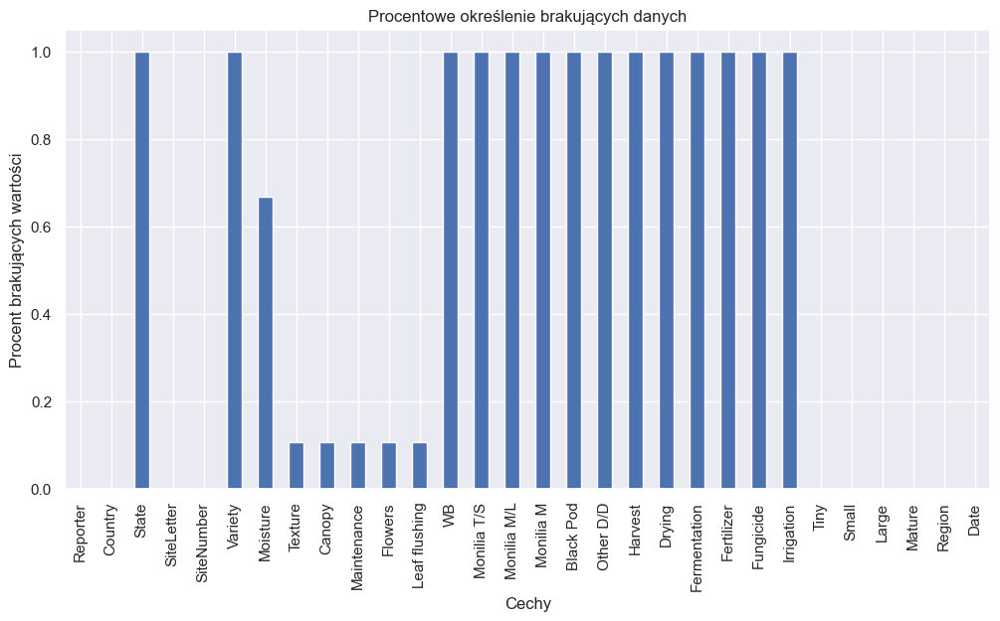

In [43]:
df.isnull().mean().plot.bar(figsize=(12,6))
plt.ylabel('Procent brakujących wartości')
plt.xlabel('Cechy')
plt.title('Procentowe określenie brakujących danych')

Kolumny State, Variety, WB, Monilia T/S, Monilia M/L, Monilia M, Black Pod, Other D/D, Harvest, Drying, Fermentation, Fertilizer, Fungicide, Irrigation mogą zostać odrzucone ze względu na brak jakichkolwiek wartości.

Ponadto ze względu na dane dotyczące tylko jednego kraju, kolumny identyfikujące kraj (Reporter, Country) mogą zostać odrzucone.

Zbiór danych wymaga dalszego przygotowania tzn. kolumny SiteLetter i SiteNumber powinny zostać zespolone, ponieważ razem tworzą unikalne ID plantacji. TreeNumber może zostać usunięte, ponieważ nie wnosi pożądanych informacji (będzie przeszkadzać w budowaniu modelu danych). Należy też sprawdzić czy w obrębie jednego znacznika czasowego i jednej plantacji nie ma wielu rekordów na temat zbiorów (kilka drzew).

Ponadto ze wskazań analityków firmy wynika, że kolumny Tiny oraz Small, a także Large oraz Mature powinny być połączone w dwie kolumny.

In [44]:
df["FarmID"] = df["SiteLetter"] + df["SiteNumber"].astype(str)
df["Tiny+Small"] = df["Tiny"] + df["Small"]
df["Large+Mature"] = df["Large"] + df["Mature"]

df["Tiny+Small"] = df["Tiny+Small"].round()
df["Large+Mature"] = df["Large+Mature"].round()

df.drop(columns=["State", "Variety", "WB", "Monilia T/S", "Monilia M/L", "Monilia M", 
                 "Black Pod", "Other D/D", "Harvest", "Drying", "Fermentation", "Fertilizer", 
                 "Fungicide", "Irrigation", "Reporter", "Country", "SiteLetter", "SiteNumber",
                 "Tiny", "Small", "Large", "Mature"], inplace=True)

In [12]:
profile = ProfileReport(df, tsmode=True, sortby="Date")
# profile.to_file('profile_report.html')
profile.to_notebook_iframe() # Show embedded in the notebook

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Zdecydowano o usunięciu kolumn, których braki wynoszą ponad 10%.

In [45]:
df.drop(columns=["Moisture", "Texture", "Canopy", "Maintenance", "Flowers", "Leaf flushing"], inplace=True)

Ponieważ założeniem jest, że model ma dokonywać predykcji na poziomie granulacji równym pojedynczej plantacji, należy sprawdzić dostępność znaczników czasowych dla każdej z nich i wykluczyć te plantacje dla których ta ilość jest bardzo mała lub obserwacje zakończyły się w pewnym przedziale czasu. Nie ma sensu dokonywać prognozy dla plantacji które przestały zbierać aktualne dane.

In [46]:
def plot_time_accesibility(categorical_list, dict_time_availability, title):
    # Convert the categories data into a DataFrame
    df_timeline = pd.DataFrame([(k, start, end) for k, v in dict_time_availability.items() for start, end in v], 
                    columns=['Category', 'Start', 'End'])

    # Convert the date strings into datetime objects
    df_timeline['Start'] = pd.to_datetime(df_timeline['Start'])
    df_timeline['End'] = pd.to_datetime(df_timeline['End'])

    # Set up the plot
    sns.set_style('whitegrid')
    fig, ax = plt.subplots(figsize=(10, 5))

    for i, data in df_timeline.iterrows():
        y = [i + 0.5] * len(data)
        # ax.hlines(y, data['Start'], data['End'], linewidth=10, color=f'C{i}')
        ax.hlines(y, data['Start'], data['End'], linewidth=10, color=['gray'])


    ax.set_yticks(range(len(categorical_list)))
    ax.set_yticklabels(categorical_list)


    # Set the plot title and axis labels
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Timeline', fontsize=14)
    ax.set_ylabel('Category', fontsize=14)

    # Show the plot
    plt.show()

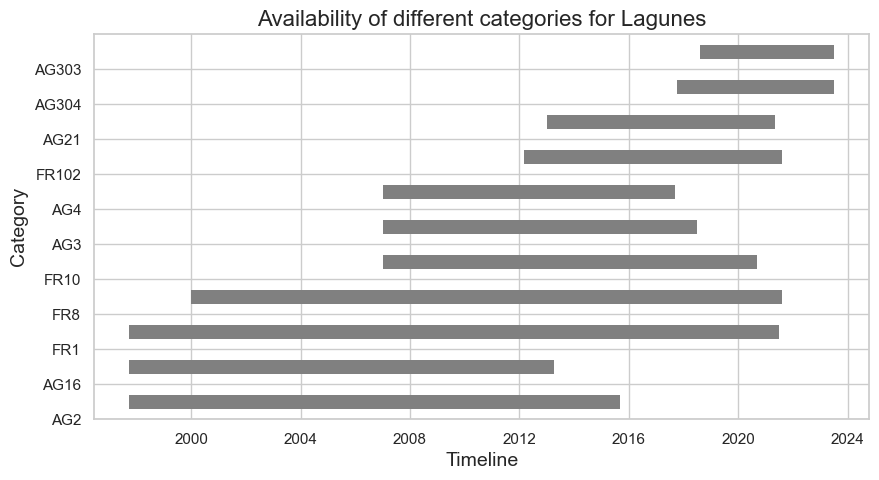

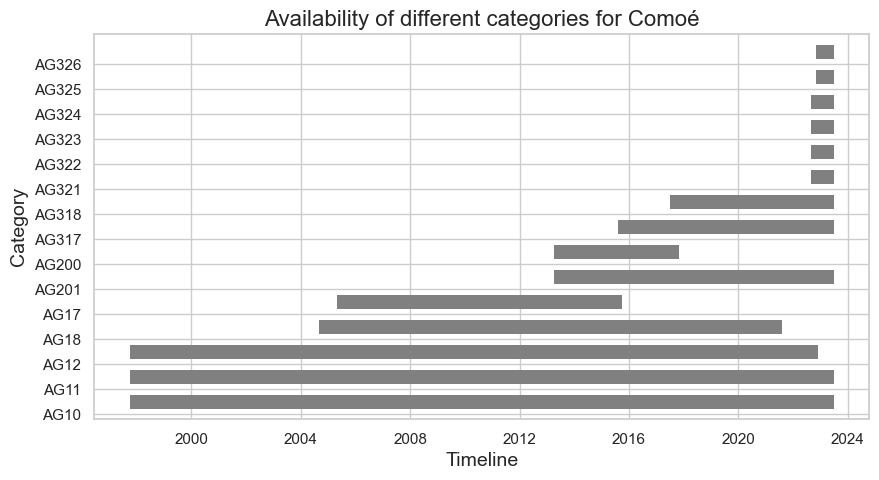

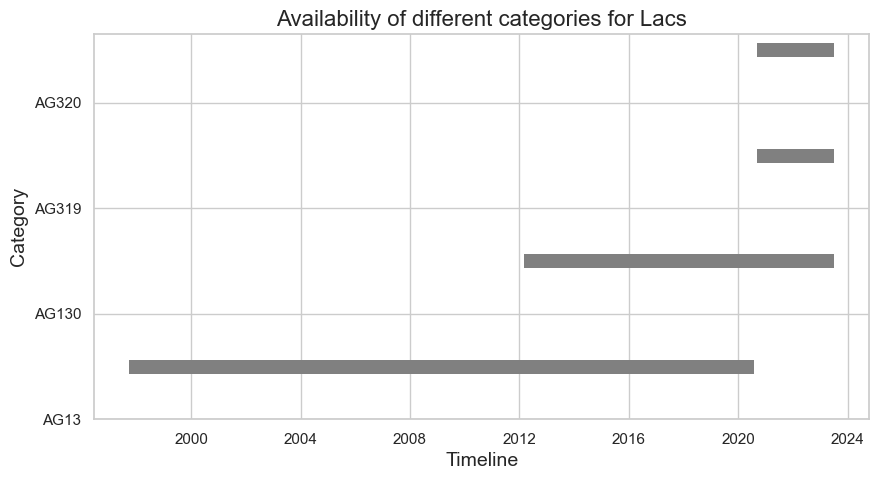

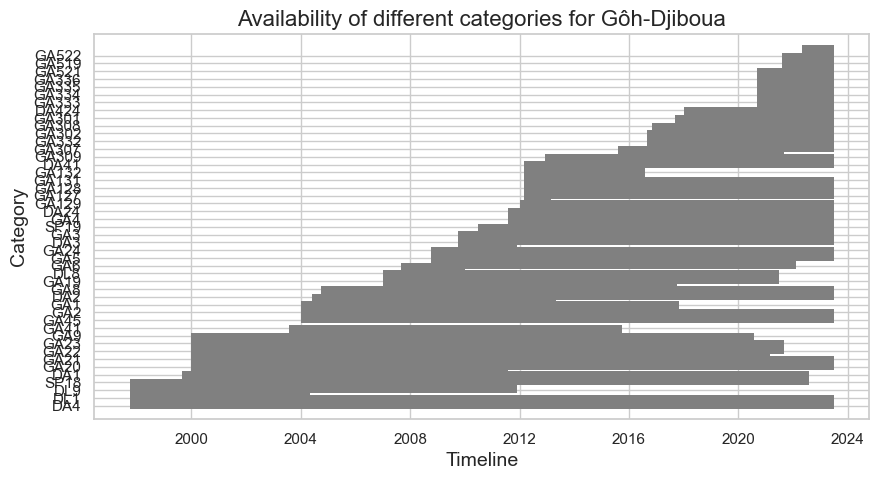

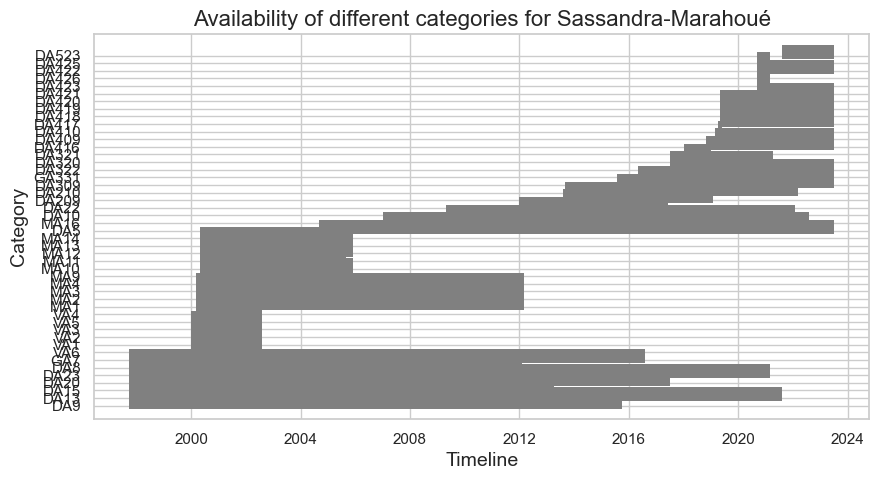

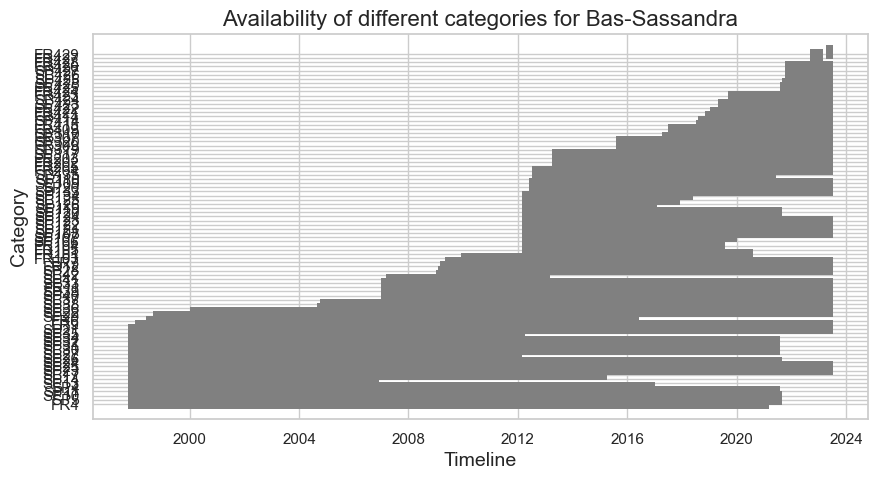

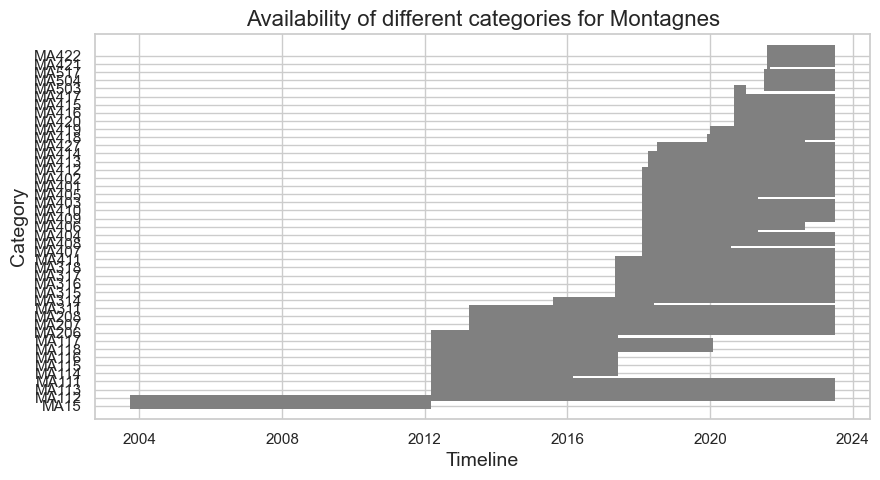

In [47]:
for region in df['Region'].unique():
    dict_time_availability = {farmid: [(df[df["FarmID"] == farmid]["Date"].min().date().strftime("%Y-%m-%d"), 
        df[df["FarmID"] == farmid]["Date"].max().date().strftime("%Y-%m-%d"))] for farmid in df[df["Region"] == region]["FarmID"].unique()}
    plot_time_accesibility(df[df["Region"] == region]["FarmID"].unique(), dict_time_availability, 'Availability of different categories for ' + region)

In [48]:
df_cleaned = df.copy()

In [49]:
for farmID in df_cleaned["FarmID"].unique():
    if (df_cleaned[df_cleaned["FarmID"] == farmID]["Date"].max() != df_cleaned["Date"].max()) or \
    (df_cleaned[df_cleaned["FarmID"] == farmID]["Date"].max() - df_cleaned[df_cleaned["FarmID"] == farmID]["Date"].min()).days / 365.25 < 5.0:
        df_cleaned.drop(df[df["FarmID"] == farmID].index, inplace=True)

Wykresy dostępności znaczników czasowych po ograniczeniu szeregów tylko do tych, które mają przynajmniej 5 letnią historię i nie kończą się przed ostatnim możliwym znacznikiem czasowym w zbiorze.

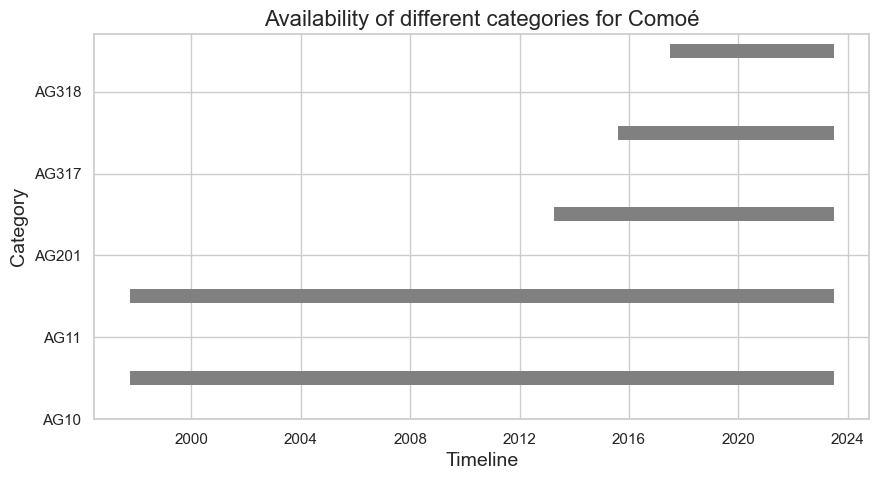

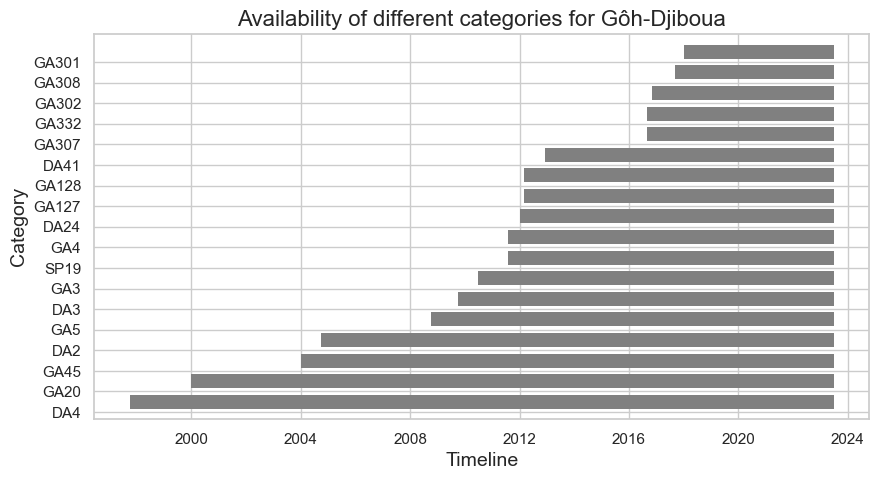

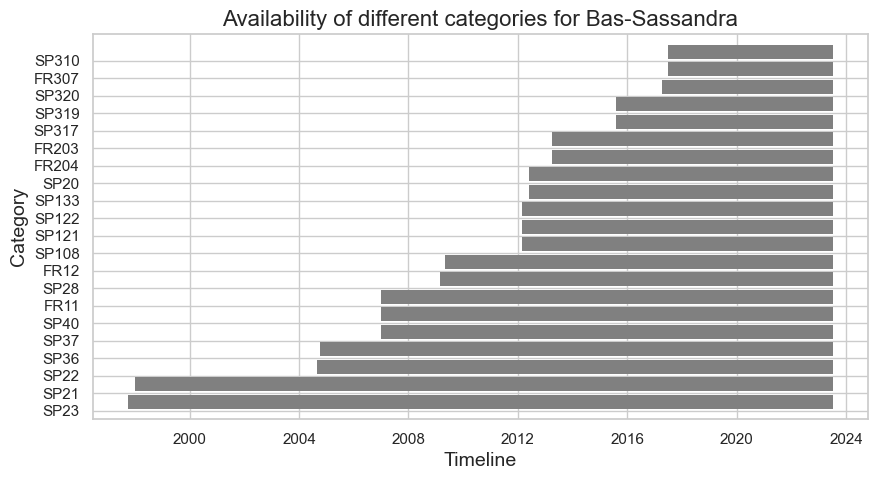

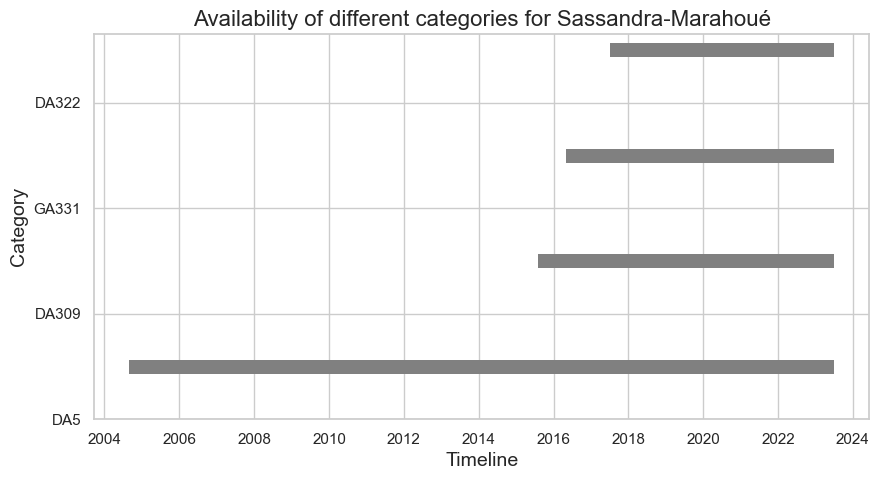

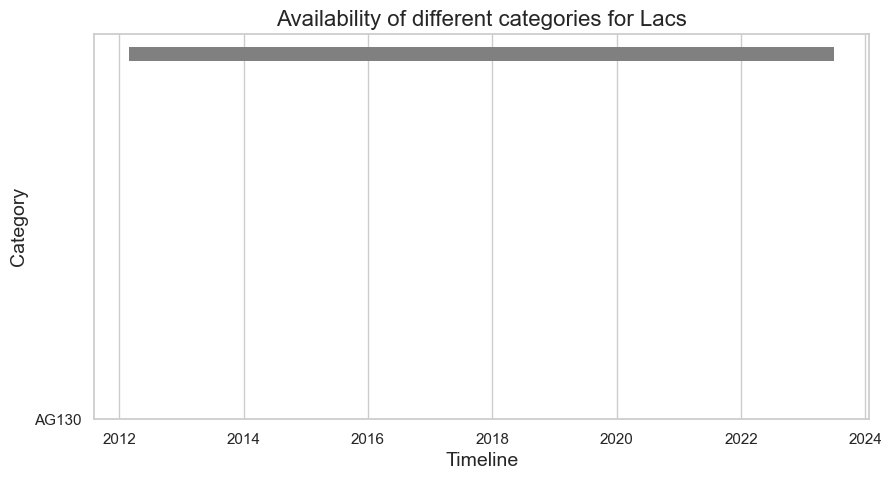

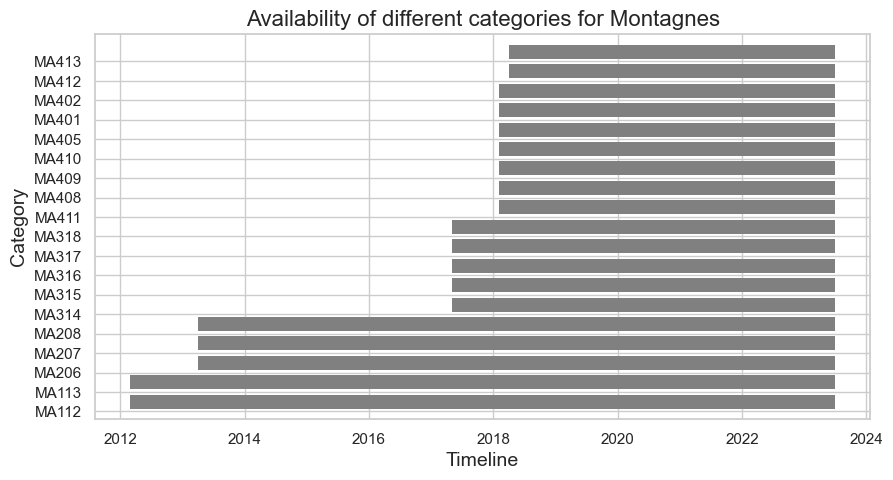

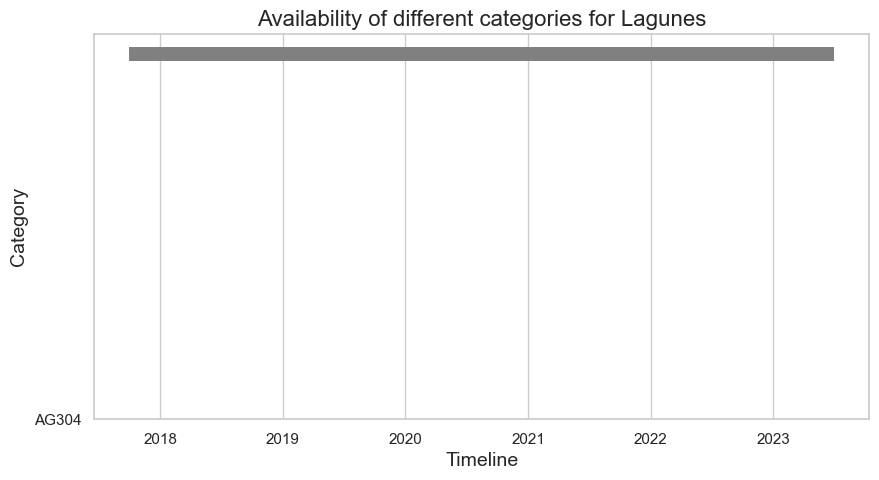

In [50]:
for region in df_cleaned['Region'].unique():
    dict_time_availability = {farmid: [(df_cleaned[df_cleaned["FarmID"] == farmid]["Date"].min().date().strftime("%Y-%m-%d"), 
        df_cleaned[df_cleaned["FarmID"] == farmid]["Date"].max().date().strftime("%Y-%m-%d"))] for farmid in df_cleaned[df_cleaned["Region"] == region]["FarmID"].unique()}
    plot_time_accesibility(df_cleaned[df_cleaned["Region"] == region]["FarmID"].unique(), dict_time_availability, 'Availability of different categories for ' + region)

In [51]:
print("Number of plantations before the data set is restricted: " + str(len(df["FarmID"].unique())))
print("Number of plantations after the data set is restricted: " + str(len(df_cleaned["FarmID"].unique())))

Number of plantations before the data set is restricted: 252
Number of plantations after the data set is restricted: 69


Co do sprawdzenia?:
* Czy każda plantacja ma jedną obserwację na jeden znacznik czasu? Na szczęście tak jest. Nic nie trzeba poprawiać.
* Czy interwał czasowy jest równy? Nie jest, trzeba wykonać interpolację.
By pokazać dlaczego wybieram dany rodzaj interpolacji, mogę wykorzystać metrykę R^2, która pokaże, która interpolacja będzie najlepsza.

O co spytać?
* O empiryczną ocenę wykresów oraz o anomialie/niestandardowe zachowanie szeregów czasowych dla pewnych stacji.
W sumie dla tego punktu dobrze byłoby zrobić wykres zbiorczy dla każdego miesiąca i zobaczyć jak mniej więcej wygląda średni przebieg,
w sensie czy jest sezonowość, trend itd.
* O interpolację liniową którą wykorzystałem. Czy zastosować jakiś sposób testu, który rodzaj interpolacji mam wybrać czy po prostu wybrać
interpolację liniową.

In [52]:
# Check if any plantation -> timestamp has more than one observation
for farmid in df_cleaned["FarmID"].unique():
    if df_cleaned[df_cleaned["FarmID"] == farmID]["Date"].duplicated().sum() != 0:
        print("{0} is wrong!".format(farmID))
# No print so no issue

In [54]:
# Turn interactive plotting off
plt.ioff()

In [66]:
# df_ivory.set_index('DATE', inplace=True)
# df_ivory.index = pd.to_datetime(df_ivory.index)
for farmID in df_cleaned["FarmID"].unique():
    fig = df_cleaned[df_cleaned["FarmID"] == farmID].set_index("Date").plot()
    plt.savefig("Farms_timeseries/"+farmID+".png")

C:\Users\BC127735\AppData\Roaming\Python\Python39\site-packages\pandas\plotting\_matplotlib\core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


C:\Users\BC127735\AppData\Roaming\Python\Python39\site-packages\pandas\plotting\_matplotlib\core.py:386: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


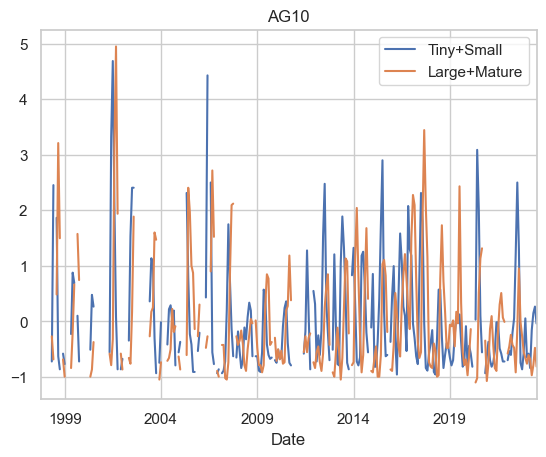

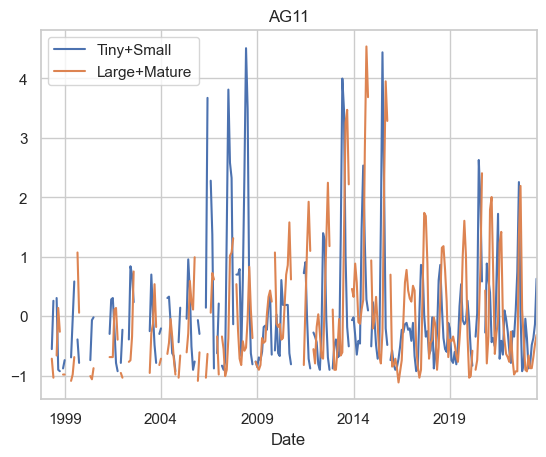

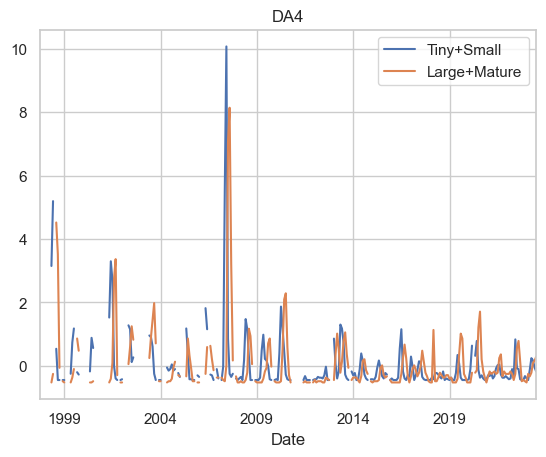

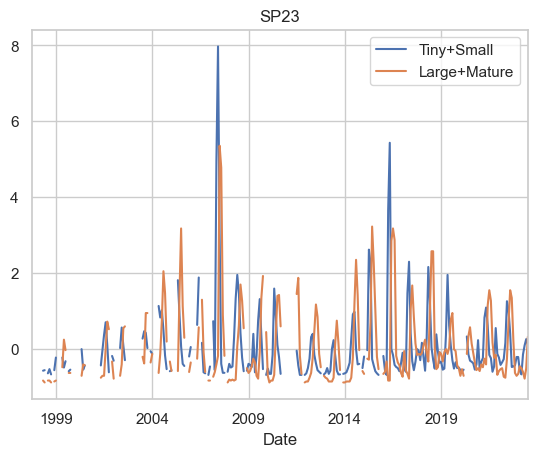

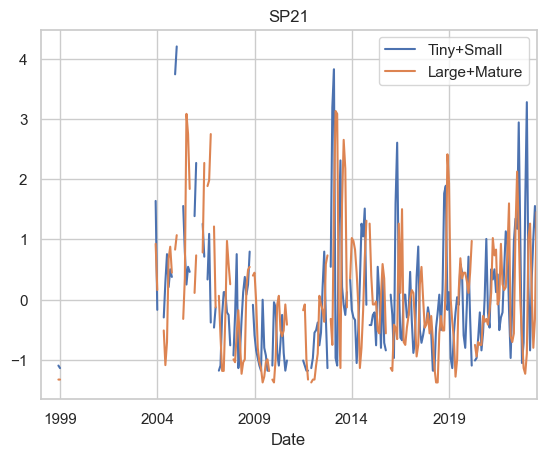

...

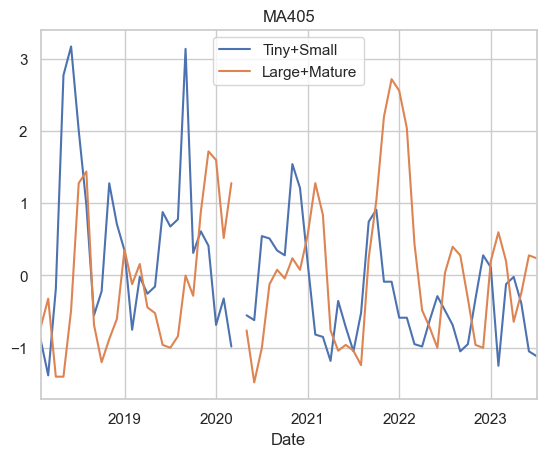

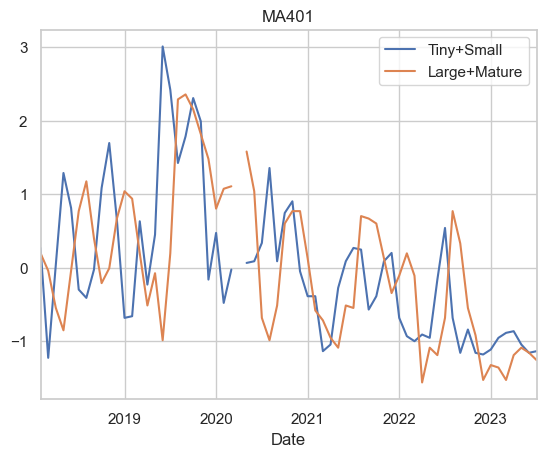

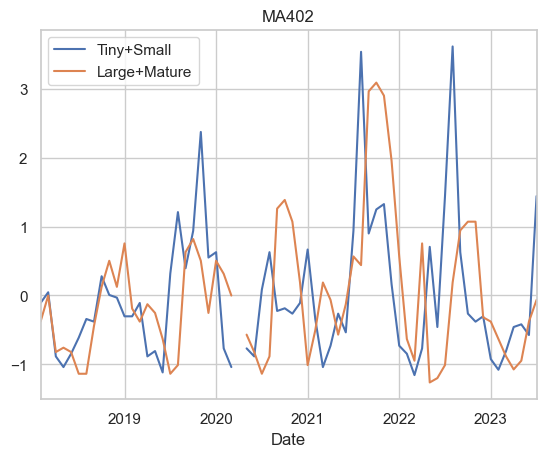

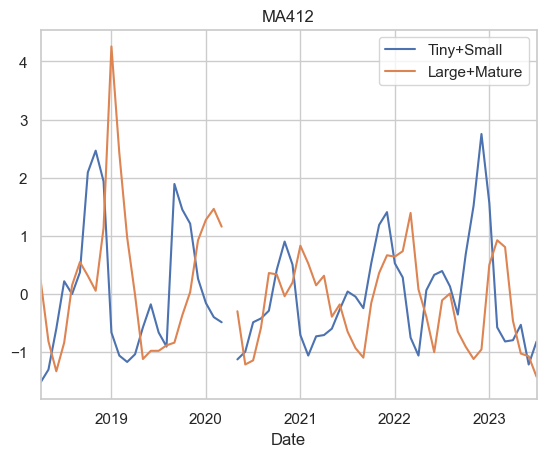

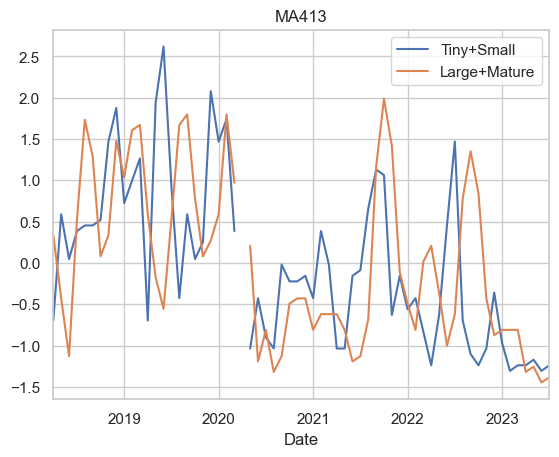

In [53]:
for farmID in df_cleaned["FarmID"].unique():
    period_array = pd.date_range(df_cleaned[df_cleaned["FarmID"] == farmID].set_index("Date").head(1).index.values[0], df_cleaned[df_cleaned["FarmID"] == farmID].set_index("Date").tail(1).index.values[0] + pd.DateOffset(months=1), freq='M')
    period_array = [i.replace(day=1).date() for i in period_array]
    df_full_period = pd.DataFrame(period_array)
    df_full_period = df_full_period.rename(columns={0: 'Date'})
    df_full_period["Value"] = 0
    df_full_period.set_index("Date", inplace=True)
    df_monthly_new = pd.merge(df_cleaned[df_cleaned["FarmID"] == farmID].set_index("Date"), df_full_period, right_index=True, left_index=True, how='right')
    df_monthly_new = df_monthly_new.drop(columns=['Value'])
    df_monthly_new["FarmID"] = df_monthly_new["FarmID"].fillna(farmID)
    df_monthly_new["Tiny+Small"] = (df_monthly_new["Tiny+Small"] - df_monthly_new["Tiny+Small"].mean()) / df_monthly_new["Tiny+Small"].std()
    df_monthly_new["Large+Mature"] = (df_monthly_new["Large+Mature"] - df_monthly_new["Large+Mature"].mean()) / df_monthly_new["Large+Mature"].std()
    df_monthly_new.plot(title=farmID)
    # plt.title("Przebieg dla " + farmID)
    # plt.xlabel("Data")
    # plt.ylabel("Wartość zbioru (po standaryzacji)")
    # plt.savefig("Farms_timeseries/"+farmID+".png")

Na podstawie analizy wizualnej można zdecydować o usunięciu stacji: SP21

In [55]:
df_cleaned = df_cleaned[df_cleaned["FarmID"] != "SP21"]

In [56]:
# Wykonanie interpolacji liniowej
df_cleaned_interpolated = pd.DataFrame()
for farmID in df_cleaned["FarmID"].unique():
    period_array = pd.date_range(df_cleaned[df_cleaned["FarmID"] == farmID].set_index("Date").head(1).index.values[0], df_cleaned[df_cleaned["FarmID"] == farmID].set_index("Date").tail(1).index.values[0] + pd.DateOffset(months=1), freq='M')
    period_array = [i.replace(day=1).date() for i in period_array]
    df_full_period = pd.DataFrame(period_array)
    df_full_period = df_full_period.rename(columns={0: 'Date'})
    df_full_period["Value"] = 0
    df_full_period.set_index("Date", inplace=True)
    df_monthly_new = pd.merge(df_cleaned[df_cleaned["FarmID"] == farmID].set_index("Date"), df_full_period, right_index=True, left_index=True, how='right')
    df_monthly_new = df_monthly_new.drop(columns=['Value'])
    df_monthly_new["FarmID"] = df_monthly_new["FarmID"].fillna(farmID)
    df_monthly_new["Region"] = df_monthly_new["Region"].fillna(df_monthly_new[df_monthly_new["FarmID"] == farmID]["Region"].unique()[0])
    df_monthly_new["Tiny+Small"] = df_monthly_new["Tiny+Small"].interpolate()
    df_monthly_new["Large+Mature"] = df_monthly_new["Large+Mature"].interpolate()
    df_cleaned_interpolated = df_cleaned_interpolated.append(df_monthly_new)
    df_monthly_new["Tiny+Small"] = (df_monthly_new["Tiny+Small"] - df_monthly_new["Tiny+Small"].mean()) / df_monthly_new["Tiny+Small"].std()
    df_monthly_new["Large+Mature"] = (df_monthly_new["Large+Mature"] - df_monthly_new["Large+Mature"].mean()) / df_monthly_new["Large+Mature"].std()
    df_monthly_new.plot(title=farmID)
    # plt.title("Przebieg dla " + farmID + " po interpolacji liniowej")
    # plt.xlabel("Data")
    # plt.ylabel("Wartość zbioru (po standaryzacji)")
    # plt.savefig("Farms_timeseries/"+farmID+"_interpolation.png")

C:\Users\BC127735\AppData\Local\Temp\ipykernel_15468\880864505.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_cleaned_interpolated = df_cleaned_interpolated.append(df_monthly_new)
C:\Users\BC127735\AppData\Local\Temp\ipykernel_15468\880864505.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_cleaned_interpolated = df_cleaned_interpolated.append(df_monthly_new)
C:\Users\BC127735\AppData\Local\Temp\ipykernel_15468\880864505.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_cleaned_interpolated = df_cleaned_interpolated.append(df_monthly_new)
C:\Users\BC127735\AppData\Local\Temp\ipykernel_15468\880864505.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future

In [57]:
df_cleaned_interpolated

,Region,FarmID,Tiny+Small,Large+Mature
Date,,,,
1997-10-01,Comoé,AG10,4.0,180.000000
1997-11-01,Comoé,AG10,17.0,124.333333
1997-12-01,Comoé,AG10,30.0,68.666667
1998-01-01,Comoé,AG10,43.0,13.000000
1998-02-01,Comoé,AG10,28.0,28.000000
...,...,...,...,...
2023-03-01,Montagnes,MA413,2.0,11.000000
2023-04-01,Montagnes,MA413,2.0,3.000000
2023-05-01,Montagnes,MA413,3.0,4.000000


In [58]:
df_cleaned_interpolated.reset_index(inplace=True)

In [26]:
df_cleaned_interpolated.set_index("Date", inplace=True)

In [59]:
df_cleaned_interpolated

,Date,Region,FarmID,Tiny+Small,Large+Mature
0,1997-10-01,Comoé,AG10,4.0,180.000000
1,1997-11-01,Comoé,AG10,17.0,124.333333
2,1997-12-01,Comoé,AG10,30.0,68.666667
3,1998-01-01,Comoé,AG10,43.0,13.000000
4,1998-02-01,Comoé,AG10,28.0,28.000000
...,...,...,...,...,...
9023,2023-03-01,Montagnes,MA413,2.0,11.000000
9024,2023-04-01,Montagnes,MA413,2.0,3.000000
9025,2023-05-01,Montagnes,MA413,3.0,4.000000
9026,2023-06-01,Montagnes,MA413,1.0,1.000000


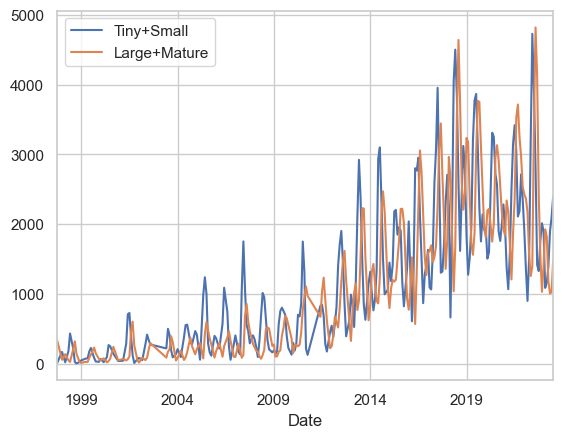

In [29]:
df_cleaned_interpolated.groupby("Date")[["Tiny+Small", "Large+Mature"]].sum().plot()
plt.show()

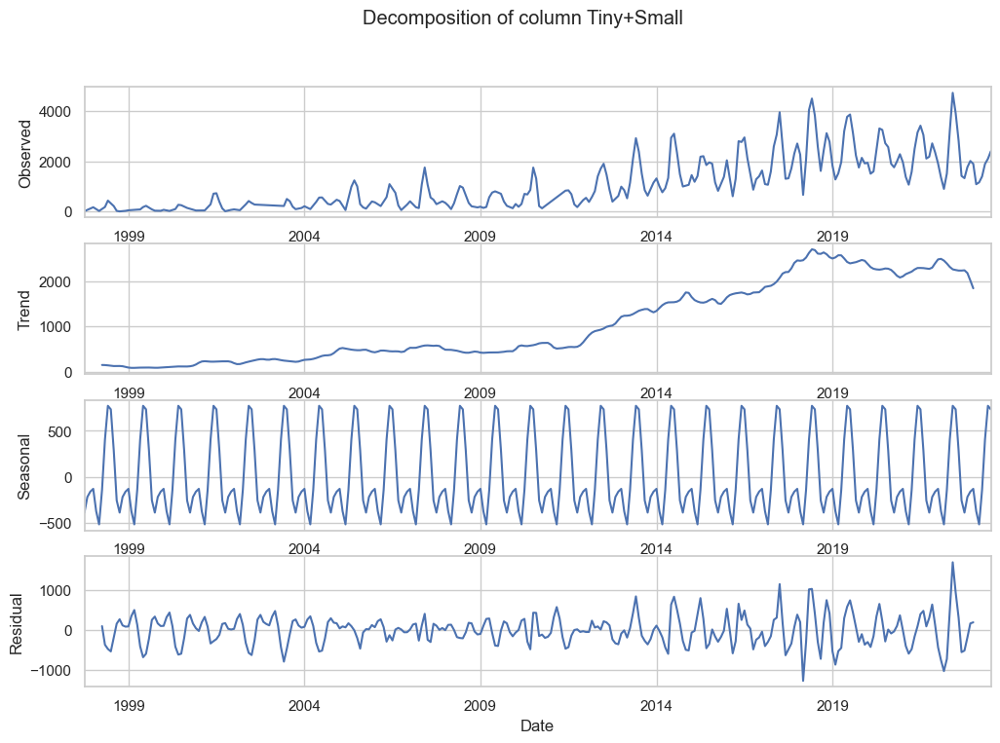

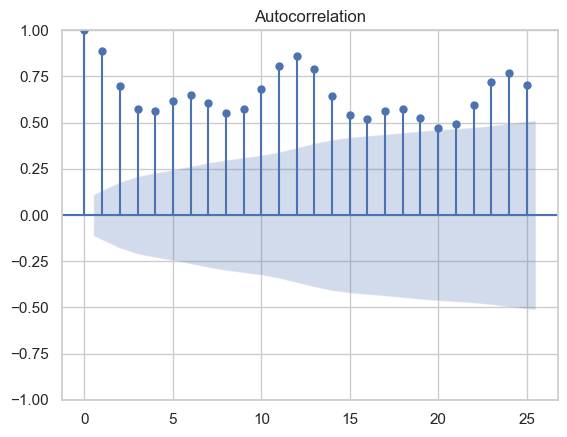

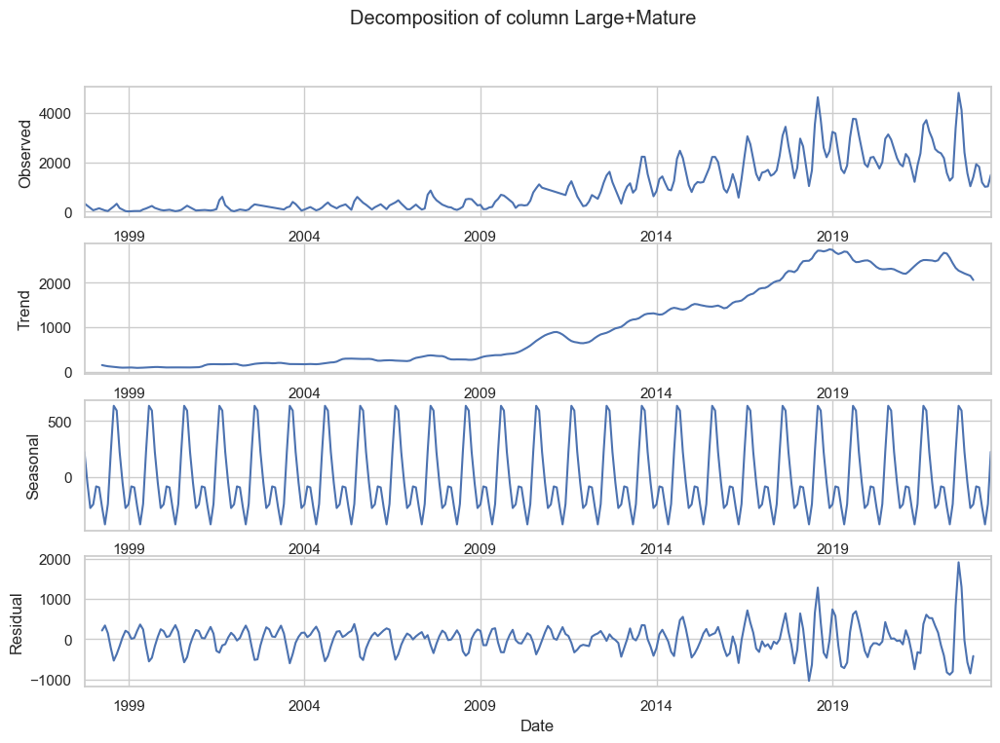

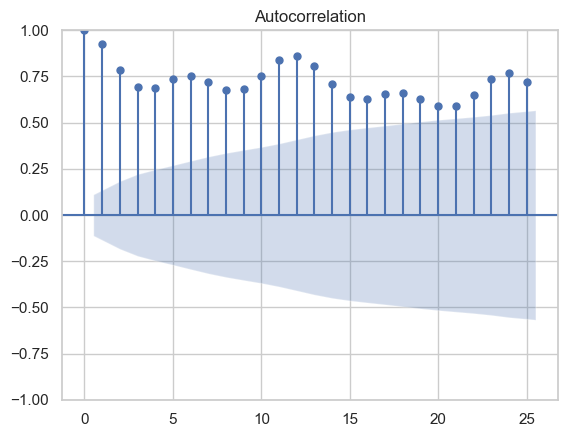

In [30]:
for column in ["Tiny+Small", "Large+Mature"]:
    decomp = seasonal_decompose(df_cleaned_interpolated.groupby("Date")[column].sum())
    # Plot the decomposition
    fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 8))
    decomp.observed.plot(ax=ax1)
    ax1.set_ylabel('Observed')
    decomp.trend.plot(ax=ax2)
    ax2.set_ylabel('Trend')
    decomp.seasonal.plot(ax=ax3)
    ax3.set_ylabel('Seasonal')
    decomp.resid.plot(ax=ax4)
    ax4.set_ylabel('Residual')

    # Add a title to the plot
    fig.suptitle("Decomposition of column " + column)

    plot_acf(df_cleaned_interpolated.groupby("Date")[column].sum())

    # Show the plot
    plt.show()

In [31]:
df_temp = df_cleaned_interpolated.groupby("Date")[["Tiny+Small", "Large+Mature"]].sum()
df_temp["Year"] = df_temp.index.year
df_temp["Month"] = df_temp.index.month

In [32]:
df_temp

,Tiny+Small,Large+Mature,Year,Month
Date,,,,
1997-10-01,13.000000,335.000000,1997,10
1997-11-01,65.333333,242.666667,1997,11
1997-12-01,117.666667,150.333333,1997,12
1998-01-01,170.000000,58.000000,1998,1
1998-02-01,96.000000,98.000000,1998,2
...,...,...,...,...
2023-03-01,1161.000000,1821.000000,2023,3
2023-04-01,1395.000000,1184.000000,2023,4
2023-05-01,1895.000000,1009.000000,2023,5


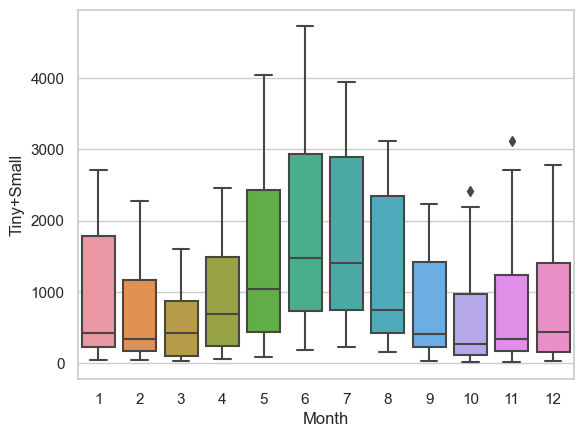

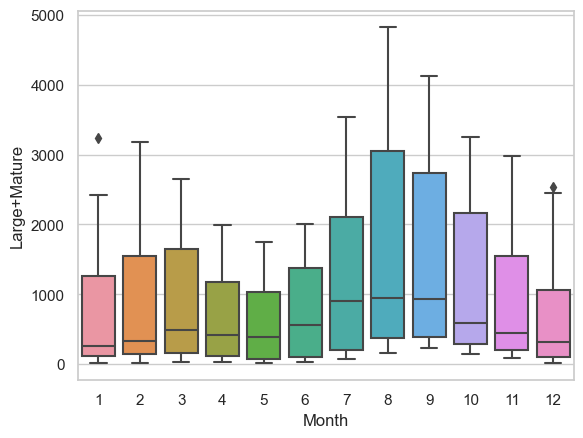

In [33]:
sns.boxplot(data=df_temp, x='Month', y='Tiny+Small')
ax.set_title('MT by Month')
plt.show()

sns.boxplot(data=df_temp, x='Month', y='Large+Mature')
ax.set_title('MT by Month')
plt.show()

In [60]:
# Zapis danych do formatu csv
df_cleaned_interpolated.to_csv("tbl_pods.csv", index=False)